In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
import re
import os
import codecs
import pandas as pd
import html2text
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from textblob import TextBlob
from nltk.corpus import stopwords
from wordcloud import WordCloud
import seaborn


In [99]:
jokes_dataframe = pd.DataFrame()

In [100]:
def load_clean_joke():

    ret_jokes = []

    for i in range(1,101):
        file = 'init'+str(i)+'.html'
        data = codecs.open('jokes/' + file, 'r', encoding="cp1252")
        joke_html = data.read()

        # Extracting joke
        joke = html2text.html2text(joke_html)
        # Extracting joke_id
        joke_id = int(file.split('init')[1].split('.html')[0])
        cleaned_string = re.sub(r'[\|]+|[-]+', '', joke)

        ret_jokes.append(cleaned_string.strip())
    
    return ret_jokes


In [101]:
Jokes = load_clean_joke()

In [102]:
jokes_dataframe["Original Jokes"] = Jokes

In [103]:
from nltk.corpus import stopwords

def remove_tags_puntuatuions_tags(Joke):
    special_char_patterns = r'[^a-zA-Z0-9\s]'
    urlPatterns = r'http\S+|www\S+'

    text = Joke

    text = re.sub(special_char_patterns, ' ', text)
    text = re.sub(urlPatterns, ' ', text)
    text = re.sub(r'\n', ' ', text)

    return text

def remove_stop_words_Tokenization(Joke):
    
    stopwords_ = set(stopwords.words('english'))
    Tokenize_Joke = []
    for word in Joke.split():
        if word not in stopwords_:
            Tokenize_Joke.append(word)

    return Tokenize_Joke

def lower(Joke):
    ret_lst = [word.lower() for word in Joke]
    return ret_lst

def preprocess_clean_jokes(uncleaned_Jokes):

    Cleaned_Jokes = []

    for Joke in uncleaned_Jokes:
        # Remove puntuations and tags from the data
        Joke = remove_tags_puntuatuions_tags(Joke)
        # Correct Spelling
        Joke = TextBlob(Joke)
        # Remove Stop Words and do Tokenization of Joke
        Joke = remove_stop_words_Tokenization(Joke)

        Cleaned_Jokes.append(lower(Joke))

    return Cleaned_Jokes



In [104]:
preprocessed_jokes = preprocess_clean_jokes(Jokes)

In [105]:
jokes_dataframe["PreProcessed Jokes"] = preprocessed_jokes

In [106]:
from nltk.stem import PorterStemmer

def stem_tokens(tokenized_text):
    stemmer = PorterStemmer()
    stemmed_tokens = []
    for preprocessed_joke in tokenized_text:
        stemmed_tokens.append([stemmer.stem(token) for token in preprocessed_joke])
    
    return stemmed_tokens

In [107]:
import nltk
from nltk.stem import WordNetLemmatizer

def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
        
    lemmatized_text = " ".join([lemmatizer.lemmatize(word) for word in text])
    
    return lemmatized_text

In [108]:
lemmitized_jokes = [lemmatize_text(text) for text in preprocessed_jokes]

In [109]:
jokes_dataframe["lemmitized_jokes"] = lemmitized_jokes 

In [110]:
from sklearn.feature_extraction.text import TfidfVectorizer

def feature_Extraction_TF_IDF(corpus):
    tfidf_vectorizer = TfidfVectorizer()
    tfidf_matrix = tfidf_vectorizer.fit_transform(corpus)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    tfidf_array = tfidf_matrix.toarray()

    return tfidf_array


In [111]:
TF_IDF_lemma = feature_Extraction_TF_IDF(lemmitized_jokes)

In [112]:
jokes_dataframe["TF_IDF_Lemma"] = [i for i in TF_IDF_lemma] 

In [113]:
def find_optimal_k(data, k_range=range(2, 55)):
    distortions = []
    silhouette_scores = []

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        
        distortions.append(kmeans.inertia_)
        
        if k > 1:
            score = silhouette_score(data, kmeans.labels_)
            silhouette_scores.append(score)
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(k_range, distortions, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Distortion (Inertia)')
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(k_range[:], silhouette_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
c:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


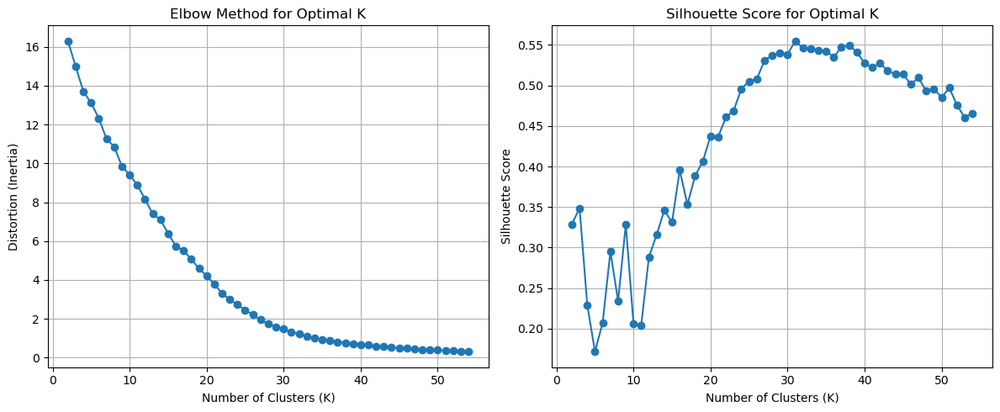

In [114]:
from sklearn.decomposition import NMF

def reduce_dimensionality(tfidf_vectors, n_components):
    nmf = NMF(n_components=n_components)
    reduced_jokes = nmf.fit_transform(tfidf_vectors)
    return reduced_jokes

def perform_clustering(reduced_jokes, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_assignments = kmeans.fit_predict(reduced_jokes)
    return cluster_assignments,kmeans

def calculate_silhouette_score(reduced_jokes, cluster_assignments):
    silhouette_avg = silhouette_score(reduced_jokes, cluster_assignments)
    return silhouette_avg


tfidf_vectors = TF_IDF_lemma
num_components = 30

reduced_jokes = reduce_dimensionality(tfidf_vectors, num_components)
find_optimal_k(reduced_jokes)


In [115]:
jokes_dataframe["Reduced_Lemmitized_Data"] = [i for i in reduced_jokes]

In [116]:
cluster_assignments,kmeans_Model = perform_clustering(reduced_jokes, 32)

silhouette_avg = calculate_silhouette_score(reduced_jokes, cluster_assignments)

print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.5326906854541437


In [117]:
jokes_dataframe["KMeans_Labels"] = [i for i in kmeans_Model.predict(reduced_jokes)]

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17828\627596331.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 5))


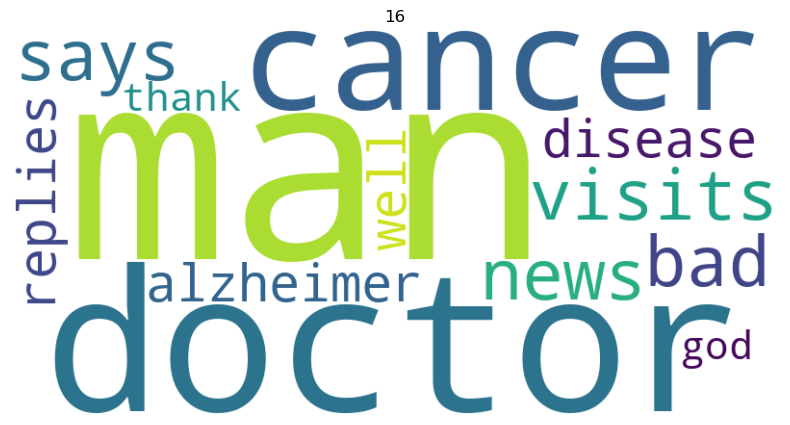

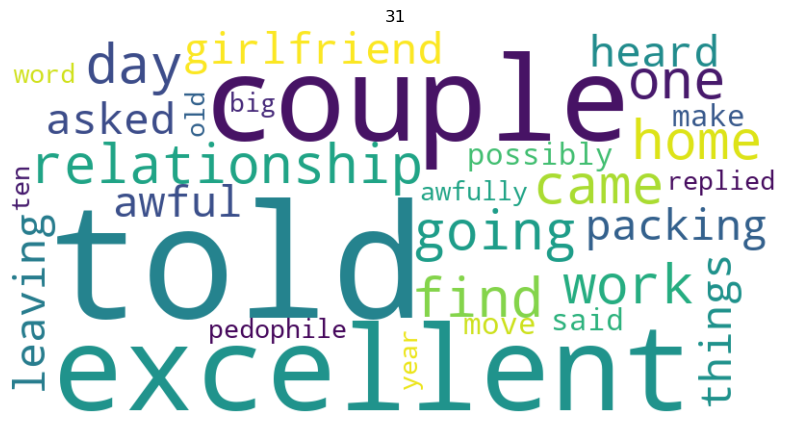

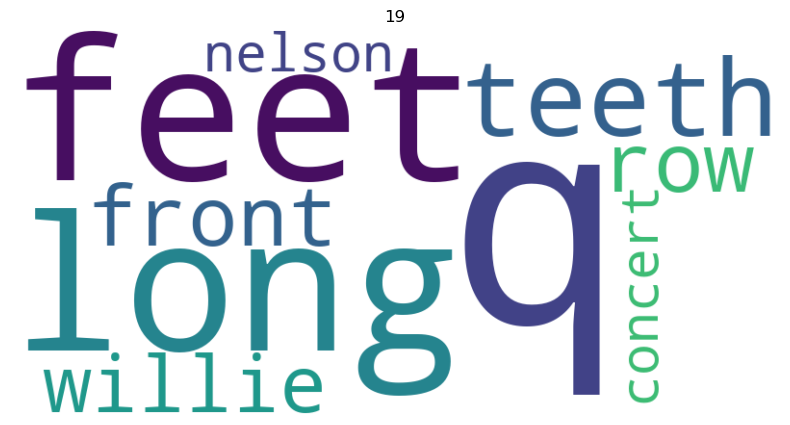

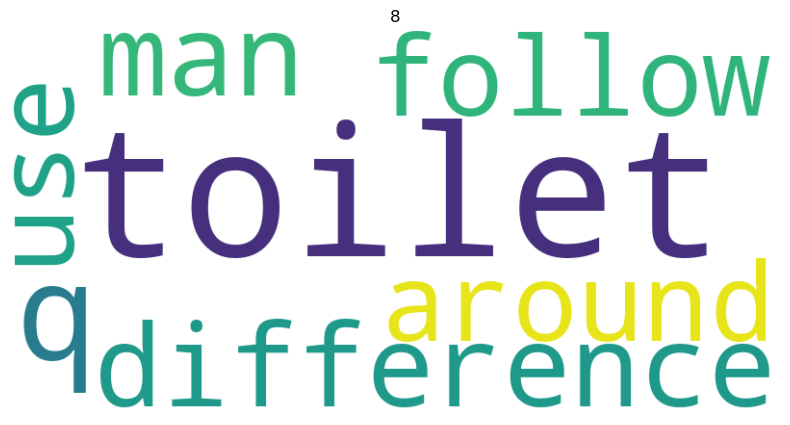

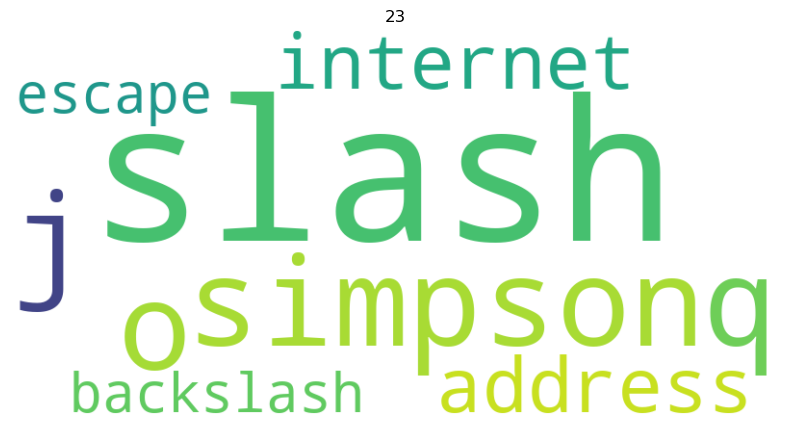

...

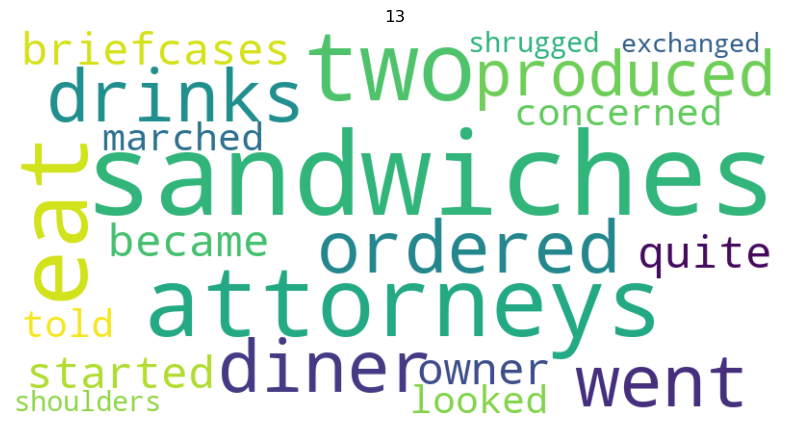

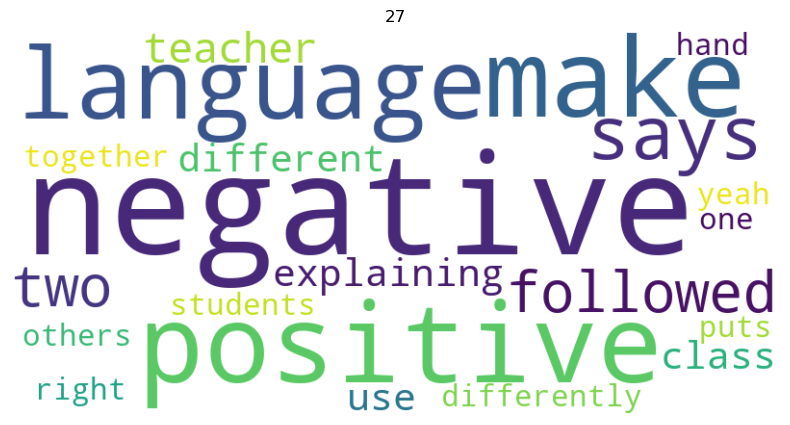

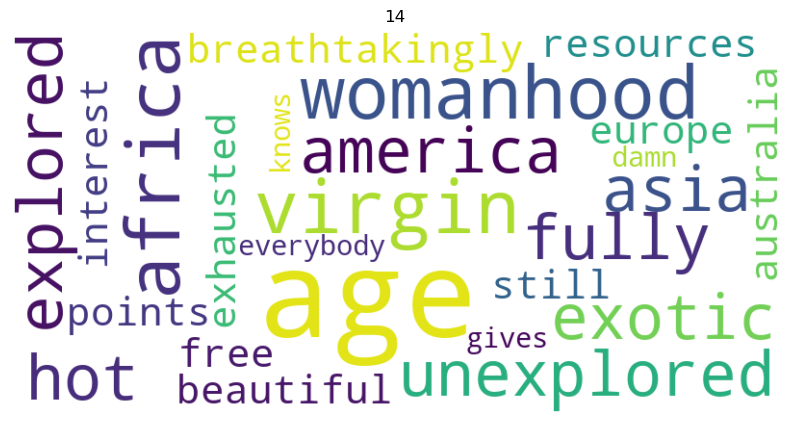

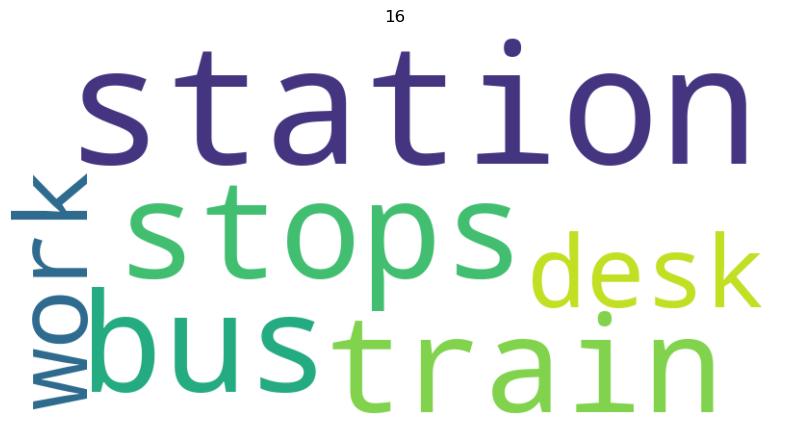

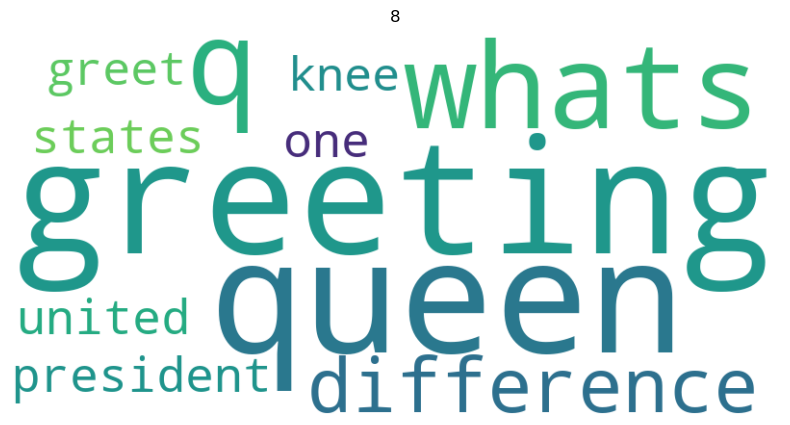

In [118]:
clustered_jokes = jokes_dataframe["PreProcessed Jokes"]
cluster_labels = jokes_dataframe["KMeans_Labels"]

for cluster_text, cluster_label in zip(clustered_jokes, cluster_labels):
    
    cluster_text = " ".join(cluster_text)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(cluster_label)
    plt.axis("off")

plt.show()


In [119]:
jokes_dataframe

,Original Jokes,PreProcessed Jokes,lemmitized_jokes,TF_IDF_Lemma,Reduced_Lemmitized_Data,KMeans_Labels
0,"A man visits the doctor. The doctor says ""I ha...","[a, man, visits, doctor, the, doctor, says, i,...",a man visit doctor the doctor say i bad news y...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.154035689801291, 0.0, 0.0, 0.0, 0.0, 0.0, 0...",16
1,This couple had an excellent relationship goin...,"[this, couple, excellent, relationship, going,...",this couple excellent relationship going one d...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.004331294892849864, 0.0, 0.0, 0.0, 0.0...",31
2,Q. What's 200 feet long and has 4 teeth?\n\nA....,"[q, what, 200, feet, long, 4, teeth, a, the, f...",q what 200 foot long 4 teeth a the front row w...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.015645762865641236, 0.0, 0.0...",19
3,Q. What's the difference between a man and a t...,"[q, what, difference, man, toilet, a, a, toile...",q what difference man toilet a a toilet follow...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.014576106480567485, 0.0, 0.0, 0.27372330425...",8
4,Q. What's O. J. Simpson's Internet address?\n\...,"[q, what, o, j, simpson, internet, address, a,...",q what o j simpson internet address a slash sl...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",23
...,...,...,...,...,...,...
95,Two attorneys went into a diner and ordered tw...,"[two, attorneys, went, diner, ordered, two, dr...",two attorney went diner ordered two drink then...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0021178740117651497, 0.0, 0.0, 0.0, 0.0, 0....",13
96,A teacher is explaining to her class how diffe...,"[a, teacher, explaining, class, different, lan...",a teacher explaining class different language ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0035232330130360117, 0....",27
97,Age and Womanhood\n\n1\. Between the ages of 1...,"[age, womanhood, 1, between, ages, 13, 18, she...",age womanhood 1 between age 13 18 she like afr...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.10500478...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",14
98,A bus station is where a bus stops. \nA train...,"[a, bus, station, bus, stops, a, train, statio...",a bus station bus stop a train station train s...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.14840984938873777,...",16


In [120]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
import numpy as np

def dbscan_with_tuning(data, min_samples_range, k_range=None, visualize=False):
    if k_range is None:
        k_range = min_samples_range
    
    optimal_min_samples = None
    optimal_eps = None
    optimal_silhouette_score = -1
    
    nn = NearestNeighbors(n_neighbors=max(k_range))
    nn.fit(data)
    distances, _ = nn.kneighbors(data)
    kth_distances = np.sort(distances[:, -1])
    
    for min_samples in min_samples_range:
        for k in k_range:
            eps = kth_distances[k - 1]
            
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)
            
            silhouette = silhouette_score(data, labels)
            
            if silhouette > optimal_silhouette_score:
                optimal_min_samples = min_samples
                optimal_eps = eps
                optimal_silhouette_score = silhouette
    
    if visualize:
        import matplotlib.pyplot as plt
        plt.plot(range(len(kth_distances)), kth_distances)
        plt.xlabel('Data Point Index')
        plt.ylabel('k-th Nearest Neighbor Distance')
        plt.title('Sorted k-th Distances')
        plt.show()
    
    return optimal_min_samples, optimal_eps, optimal_silhouette_score

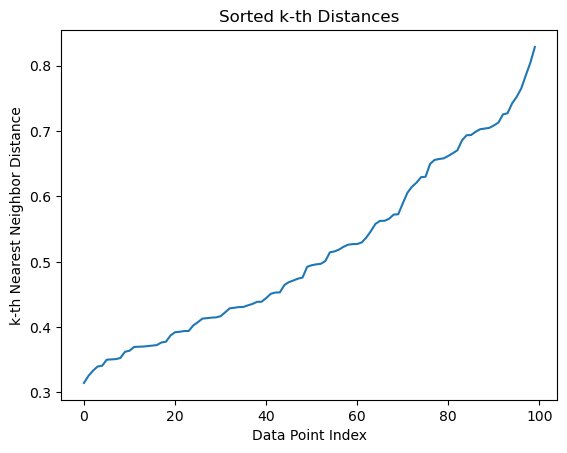

(30, 0.4296776449273708, 0.2538494976619191)

In [121]:
dbscan_with_tuning(reduced_jokes, [i for i in range(30,41,2)], visualize=True)

In [122]:
from sklearn.cluster import SpectralClustering

def apply_spectral(data, clusters_range):

    silhouette_scores = []

    for n_clusters in clusters_range:

        affinity_matrix = np.exp(-0.5 * np.square(data - data[:, np.newaxis]).sum(axis=2))

        spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='precomputed')
        labels = spectral_clustering.fit_predict(affinity_matrix)
        
        silhouette = silhouette_score(data, labels)

        silhouette_scores.append(silhouette)

    plt.plot(clusters_range, silhouette_scores, marker='o')
    plt.title('Silhouette Score for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

    return max(silhouette_scores), silhouette_scores.index(max(silhouette_scores)) * 2


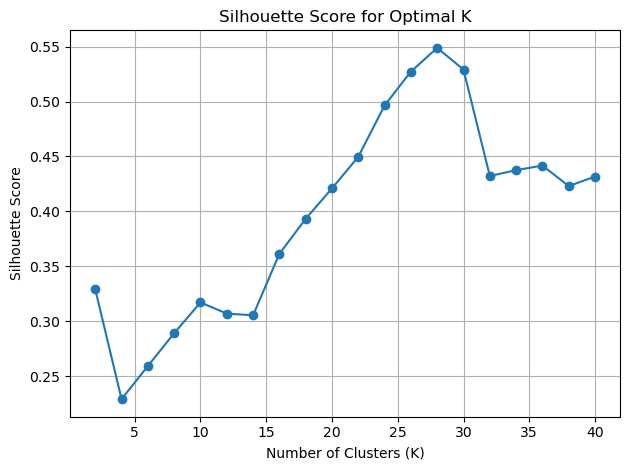

(0.5489206073025134, 26)

In [123]:
apply_spectral(reduced_jokes, [i for i in range(2,41,2)])

In [124]:
affinity_matrix = np.exp(-0.5 * np.square(reduced_jokes - reduced_jokes[:, np.newaxis]).sum(axis=2))

spectral_clustering = SpectralClustering(n_clusters=28, affinity='precomputed')
labels = spectral_clustering.fit_predict(affinity_matrix)
        

In [125]:
jokes_dataframe["Spectral_Labels"] = labels

In [126]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def apply_Hierarchial(data):

    cluster_range = range(2, 50)

    silhouette_scores = []

    for n_clusters in cluster_range:
        hierarchical = AgglomerativeClustering(n_clusters=n_clusters)
        labels = hierarchical.fit_predict(data)
        
        silhouette = silhouette_score(data, labels)
        silhouette_scores.append(silhouette)

    plt.plot(cluster_range, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Scores for Hierarchical Clustering')
    plt.show()

    return max(silhouette_scores), silhouette_scores.index(max(silhouette_scores)) + 2


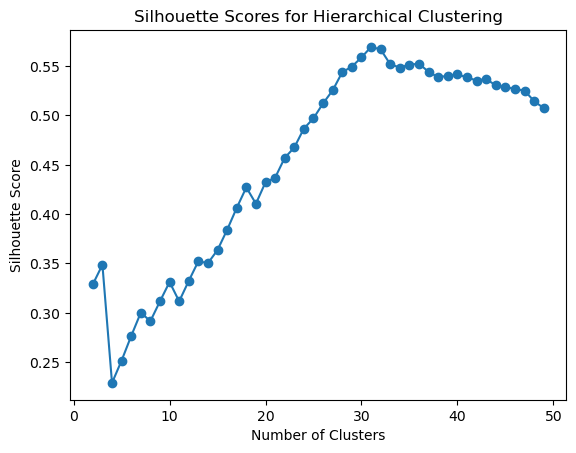

(0.569502489774645, 31)

In [127]:
apply_Hierarchial(reduced_jokes)

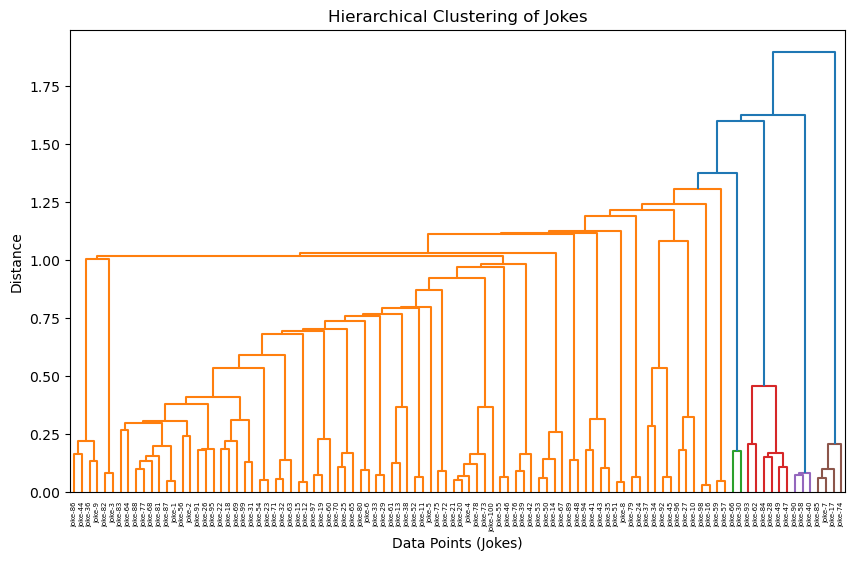

In [128]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

hierarchical = AgglomerativeClustering(n_clusters=31)
labels = hierarchical.fit_predict(reduced_jokes)

linkage_matrix = linkage(reduced_jokes, method='ward')

data_point_labels = [f'joke-{i}' for i in range(1,101)]

plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix, orientation='top', labels=data_point_labels, distance_sort='descending')
plt.title('Hierarchical Clustering of Jokes')
plt.xlabel('Data Points (Jokes)')
plt.ylabel('Distance')
plt.show()

In [129]:
jokes_dataframe["Hierarchial Labels"] = labels

In [130]:
labels_model1 = np.array(jokes_dataframe["KMeans_Labels"])
labels_model2 = np.array(jokes_dataframe["Hierarchial Labels"])
labels_model3 = np.array(jokes_dataframe["Spectral_Labels"])
